## Imports

In [17]:
# imports

import numpy as np
import pandas as pd
import keras
import matplotlib.pyplot as plt
import cv2

from skimage import io, transform
import glob

import tensorflow as tf
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Lambda, GlobalAveragePooling2D, Concatenate, Dropout, Rescaling
from keras.applications import ResNet50
from keras.applications.resnet50 import preprocess_input
from keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

## Data

In [2]:
# get our train data
train_ds = keras.preprocessing.image_dataset_from_directory(
    'data/train',
    subset='training',
    validation_split=0.2,
    seed=42,
    image_size=(256, 256)
)

class_labels = train_ds.class_names

val_ds = keras.preprocessing.image_dataset_from_directory(
    'data/train',
    subset='validation',
    validation_split=0.2,
    seed=42,
    image_size=(256, 256)
)

Found 485 files belonging to 2 classes.
Using 388 files for training.
Found 485 files belonging to 2 classes.
Using 97 files for validation.


images: (32, 256, 256, 3) <dtype: 'float32'> labels: (32,) <dtype: 'int32'>
image data range: 0.0 255.0


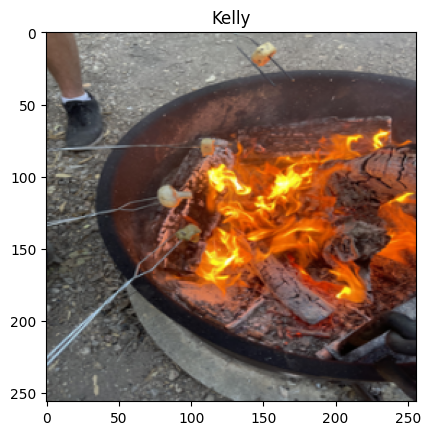

2024-12-05 21:51:30.157642: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [3]:
# checking the data
for images, labels in train_ds.take(1):
  print('images:',images.shape,images.dtype,'labels:',labels.shape,labels.dtype)
  print('image data range:',images[0].numpy().min(),images[0].numpy().max())
  plt.imshow(images[0].numpy().astype('uint8'))
  plt.title(class_labels[labels[0].numpy()])
  plt.show()

In [4]:
# get our test 01 data
test_images1 = []

for filename in glob.glob('data/TestSet01/*.png'):
    img = io.imread(filename)
    # resized data bc all images are different sizes
    img_resize = transform.resize(img, (256,256,3)).astype('float32')
    test_images1.append(img_resize)

test_images1 = np.array(test_images1)
test_images1.shape

(20, 256, 256, 3)

In [5]:
# get our test 02 data
test_images2 = []

for filename in glob.glob('data/TestSet02/*.png'):
    img = io.imread(filename)
    # resized data bc all images are different sizes
    img_resize = transform.resize(img, (256,256,3)).astype('float32')
    test_images2.append(img_resize)

test_images2 = np.array(test_images2)
test_images2.shape

(24, 256, 256, 3)

## Model

In [6]:
model = Sequential([
    Input(shape=(256, 256, 3)),
    Rescaling(1.0/255),
    Lambda(preprocess_input),
    ResNet50(include_top=False, pooling='avg'),
    Dense(2, activation='softmax')
])

model.layers[2].trainable = False

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda (Lambda)                 │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 2048)           │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 2)              │         4,098 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,591,810 (90.00 MB)

 Trainable params: 4,098 (16.01 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [7]:
model.compile(
    optimizer=Adam(learning_rate=3e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [8]:
# Define callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
lr_reduce = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)
checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,
    callbacks=[early_stop, lr_reduce, checkpoint]
)

Epoch 1/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 69s 5s/step - accuracy: 0.5307 - loss: 0.6954 - val_accuracy: 0.5417 - val_loss: 0.6841 - learning_rate: 3.0000e-04
Epoch 2/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 65s 5s/step - accuracy: 0.5561 - loss: 0.6844 - val_accuracy: 0.5208 - val_loss: 0.6827 - learning_rate: 3.0000e-04
Epoch 3/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 65s 5s/step - accuracy: 0.6358 - loss: 0.6810 - val_accuracy: 0.6042 - val_loss: 0.6810 - learning_rate: 3.0000e-04
Epoch 4/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 60s 4s/step - accuracy: 0.6124 - loss: 0.6833 - val_accuracy: 0.5000 - val_loss: 0.6767 - learning_rate: 3.0000e-04
Epoch 5/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 68s 5s/step - accuracy: 0.5422 - loss: 0.6837 - val_accuracy: 0.5000 - val_loss: 0.6738 - learning_rate: 3.0000e-04
Epoch 6/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 67s 5s/step - accuracy: 0.5557 - loss: 0.6830 - val_accuracy: 0.6458 - val_loss: 0.6724 - learning_rate: 3.0000e-04
Epoch 7/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 63s 5s/step - accuracy: 0.5915 - loss:

In [ ]:
# Load the best fine-tuned model
model.load_weights('best_model.keras')

# Unfreeze top N layers of ResNet50 for fine-tuning
N = 10  # Number of layers to unfreeze
resnet_base = model.layers[2]

for layer in resnet_base.layers[-N:]:
    layer.trainable = True

# Recompile the model with a lower learning rate
model.compile(
    optimizer=Adam(learning_rate=1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [10]:
# Continue training with fine-tuning
history_fine = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,
    callbacks=[early_stop, lr_reduce, checkpoint]
)

Epoch 1/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 80s 5s/step - accuracy: 0.6004 - loss: 0.6601 - val_accuracy: 0.6458 - val_loss: 0.6590 - learning_rate: 1.0000e-05
Epoch 2/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 68s 5s/step - accuracy: 0.7260 - loss: 0.6102 - val_accuracy: 0.7917 - val_loss: 0.6600 - learning_rate: 1.0000e-05
Epoch 3/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 67s 5s/step - accuracy: 0.7459 - loss: 0.5773 - val_accuracy: 0.6458 - val_loss: 0.6668 - learning_rate: 1.0000e-05
Epoch 4/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 70s 5s/step - accuracy: 0.7204 - loss: 0.5669 - val_accuracy: 0.4792 - val_loss: 0.6785 - learning_rate: 1.0000e-05
Epoch 5/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 86s 6s/step - accuracy: 0.7385 - loss: 0.5514 - val_accuracy: 0.4583 - val_loss: 0.6901 - learning_rate: 2.0000e-06
Epoch 6/10
14/14 ━━━━━━━━━━━━━━━━━━━━ 81s 6s/step - accuracy: 0.7460 - loss: 0.5517 - val_accuracy: 0.4583 - val_loss: 0.7042 - learning_rate: 2.0000e-06


In [11]:
# Load the best fine-tuned model
model.load_weights('best_model.keras')

# Evaluate the model
val_loss, val_accuracy = model.evaluate(val_ds)
print(f'Validation Loss: {val_loss}')
print(f'Validation Accuracy: {val_accuracy}')

2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.6389 - loss: 0.6610
Validation Loss: 0.6590243577957153
Validation Accuracy: 0.6458333134651184


## Model 2

In [37]:
# Function to extract color histogram (for each channel separately)
def extract_color_histogram(image):
    # Ensure the image is in RGB format before converting to HSV
    if len(image.shape) == 2:  # If grayscale (1 channel)
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)  # Convert grayscale to RGB by duplicating channels
    elif image.shape[2] == 4:  # If the image has 4 channels (RGBA)
        image = cv2.cvtColor(image, cv2.COLOR_RGBA2RGB)  # Convert RGBA to RGB
    
    # Convert the image to HSV and compute the histogram
    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    hist_hue = cv2.calcHist([image_hsv], [0], None, [256], [0, 256])
    hist_saturation = cv2.calcHist([image_hsv], [1], None, [256], [0, 256])
    hist_value = cv2.calcHist([image_hsv], [2], None, [256], [0, 256])
    
    # Normalize and flatten the histograms
    hist_hue = cv2.normalize(hist_hue, hist_hue).flatten()
    hist_saturation = cv2.normalize(hist_saturation, hist_saturation).flatten()
    hist_value = cv2.normalize(hist_value, hist_value).flatten()
    
    # Combine all histograms into a single feature vector
    return np.concatenate([hist_hue, hist_saturation, hist_value])


def data_generator_with_features(dataset):
    for images, labels in dataset:
        batch_size = images.shape[0]
        color_hist_features = []
        
        # Process each image and extract color histograms
        for i in range(batch_size):
            image = images[i].numpy()  # Convert image to numpy array
            color_hist = extract_color_histogram(image)
            color_hist_features.append(color_hist)
        
        # Convert to numpy arrays
        color_hist_features = np.array(color_hist_features)
        
        # Convert everything to tf.Tensor before yielding
        images = tf.convert_to_tensor(images, dtype=tf.float32)
        color_hist_features = tf.convert_to_tensor(color_hist_features, dtype=tf.float32)
        
        # Explicitly cast labels to int64
        labels = tf.cast(labels, tf.int64)
        
        yield (images, color_hist_features), labels

In [38]:
# Input for images
image_input = Input(shape=(256, 256, 3), dtype=tf.float32)

# Rescaling and Preprocessing
x = Rescaling(1.0/255)(image_input)
x = Lambda(lambda img: preprocess_input(img))(x)

# ResNet feature extractor (without top)
resnet_base = ResNet50(include_top=False, pooling='avg', weights='imagenet')
resnet_base.trainable = False

# Get ResNet output
resnet_output = resnet_base(x)
    
# Input layer for color histogram features
color_hist_input = Input(shape=(768,), dtype=tf.float32, name='color_hist_input')
    
# Concatenate ResNet50 output with color histogram features
combined = Concatenate()([resnet_output, color_hist_input])
    
# Fully connected layers
x = Dense(128, activation='relu')(combined)
x = Dense(64, activation='relu')(x)  # Optional additional dense layer
output = Dense(2, activation='softmax')(x)  # Adjust number of units based on classes
    
# Create the model
full_model = Model(inputs=[image_input, color_hist_input], outputs=output)
    
# Compile the model
full_model.compile(optimizer=Adam(learning_rate=3e-4), 
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])

# Model summary
full_model.summary()

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_52      │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_2         │ (None, 256, 256,  │          0 │ input_layer_52[0… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda_2 (Lambda)   │ (None, 256, 256,  │          0 │ rescaling_2[0][0] │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 2048)      │ 23,587,712 │ lambda_2[0][0]    │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ color_hist_input    │ (None, 768)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_12      │ (None, 2816)      │          0 │ resnet50[0][0],   │
│ (Concatenate)       │                   │            │ color_hist_input… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_23 (Dense)    │ (None, 128)       │    360,576 │ concatenate_12[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_24 (Dense)    │ (None, 64)        │      8,256 │ dense_23[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_25 (Dense)    │ (None, 2)         │        130 │ dense_24[0][0]    │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 23,956,674 (91.39 MB)

 Trainable params: 368,962 (1.41 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
# Callbacks
early_stop2 = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
lr_reduce2 = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)
checkpoint2 = ModelCheckpoint('best_model_2.keras', monitor='val_loss', save_best_only=True)

# Use the updated dataset in model training
train_ds_with_features = tf.data.Dataset.from_generator(
    lambda: data_generator_with_features(train_ds),
    output_signature=(
        (
            tf.TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32),  # Image data
            tf.TensorSpec(shape=(None, 768), dtype=tf.float32)           # Color histogram features
        ),
        tf.TensorSpec(shape=(None,), dtype=tf.int64)  # Labels
    )
)

val_ds_with_features = tf.data.Dataset.from_generator(
    lambda: data_generator_with_features(val_ds),
    output_signature=(
        (
            tf.TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32),  # Image data
            tf.TensorSpec(shape=(None, 768), dtype=tf.float32)           # Color histogram features
        ),
        tf.TensorSpec(shape=(None,), dtype=tf.int64)  # Labels
    )
)

# Check one batch of data before training
for batch in train_ds_with_features.take(1):
    (images, color_hist_features), labels = batch
    print(f"Images dtype: {images.dtype}")
    print(f"Color hist features dtype: {color_hist_features.dtype}")
    print(f"Labels dtype: {labels.dtype}")

# Train the model
history2 = full_model.fit(
    train_ds_with_features,
    validation_data=val_ds_with_features,
    epochs=20,
    callbacks=[early_stop2, lr_reduce2, checkpoint2]
)

Images dtype: <dtype: 'float32'>
Color hist features dtype: <dtype: 'float32'>
Labels dtype: <dtype: 'int64'>
Epoch 1/10


/Users/sreshtalluri/Documents/CSC/DATA/data403-project3/.venv/lib/python3.9/site-packages/keras/src/models/functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor_4129', 'color_hist_input']. Received: the structure of inputs=('*', '*')
  warnings.warn(


     13/Unknown 18s 1s/step - accuracy: 0.4415 - loss: 0.7526

/Library/Developer/CommandLineTools/Library/Frameworks/Python3.framework/Versions/3.9/lib/python3.9/contextlib.py:135: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(type, value, traceback)


13/13 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - accuracy: 0.4449 - loss: 0.7501 - val_accuracy: 0.5876 - val_loss: 0.6820 - learning_rate: 3.0000e-04
Epoch 2/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4803 - loss: 0.6949

2024-12-05 22:32:01.701468: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


13/13 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.4825 - loss: 0.6945 - val_accuracy: 0.5670 - val_loss: 0.6738 - learning_rate: 3.0000e-04
Epoch 3/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - accuracy: 0.5546 - loss: 0.6714 - val_accuracy: 0.7320 - val_loss: 0.6634 - learning_rate: 3.0000e-04
Epoch 4/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - accuracy: 0.6864 - loss: 0.6559 - val_accuracy: 0.7526 - val_loss: 0.6538 - learning_rate: 3.0000e-04
Epoch 5/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - accuracy: 0.6526 - loss: 0.6587 - val_accuracy: 0.4948 - val_loss: 0.6710 - learning_rate: 3.0000e-04
Epoch 6/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5506 - loss: 0.6579

2024-12-05 22:33:31.354588: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


13/13 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - accuracy: 0.5525 - loss: 0.6573 - val_accuracy: 0.6186 - val_loss: 0.6452 - learning_rate: 3.0000e-04
Epoch 7/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - accuracy: 0.6350 - loss: 0.6416 - val_accuracy: 0.5670 - val_loss: 0.6389 - learning_rate: 3.0000e-04
Epoch 8/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - accuracy: 0.6175 - loss: 0.6183 - val_accuracy: 0.6392 - val_loss: 0.6273 - learning_rate: 3.0000e-04
Epoch 9/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 50s 4s/step - accuracy: 0.6726 - loss: 0.6142 - val_accuracy: 0.7526 - val_loss: 0.6051 - learning_rate: 3.0000e-04
Epoch 10/10
13/13 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - accuracy: 0.7128 - loss: 0.5785 - val_accuracy: 0.7629 - val_loss: 0.5975 - learning_rate: 3.0000e-04


In [ ]:
# Load the best weights after the initial training phase
# full_model.load_weights('best_model.keras')

# Unfreeze the top layers of ResNet50 for fine-tuning
# for layer in base_model.layers[-10:]:
#     layer.trainable = True

# Fine-tune the model with a lower learning rate
# full_model.compile(optimizer=Adam(learning_rate=1e-5),
#                    loss='sparse_categorical_crossentropy',
#                    metrics=['accuracy'])

# Continue training the model with fine-tuning
# history2_fine = full_model.fit(
#     data_generator_with_features(train_ds),
#     validation_data=data_generator_with_features(val_ds),
#     epochs=10,  # Additional epochs for fine-tuning
#     callbacks=[early_stop2, lr_reduce2, checkpoint2]
# )

In [43]:
# Load the best weights
full_model.load_weights('best_model_2.keras')

# Evaluate the model
val_loss, val_accuracy = full_model.evaluate(val_ds_with_features)
print(f'Validation Loss: {val_loss}')
print(f'Validation Accuracy: {val_accuracy}')

4/4 ━━━━━━━━━━━━━━━━━━━━ 4s 861ms/step - accuracy: 0.7760 - loss: 0.5901
Validation Loss: 0.5974502563476562
Validation Accuracy: 0.7628865838050842


## Predictions

In [48]:
# Extract color histograms for a batch of images
def extract_color_histograms_for_batch(images):
    color_hist_features = []
    for image in images:
        hist = extract_color_histogram(image)  # Assuming extract_color_histogram is defined
        color_hist_features.append(hist)
    return np.array(color_hist_features)

# Extract color histograms for the test images
test_color_histograms1 = extract_color_histograms_for_batch(test_images1)
test_color_histograms2 = extract_color_histograms_for_batch(test_images2)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 791ms/step


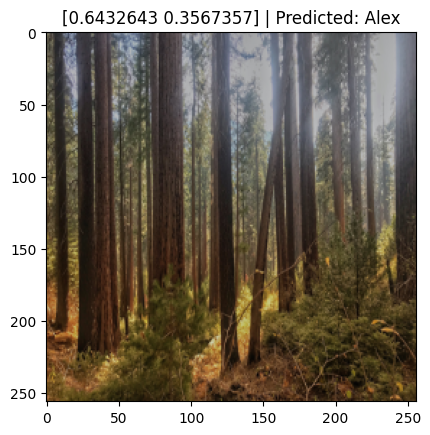

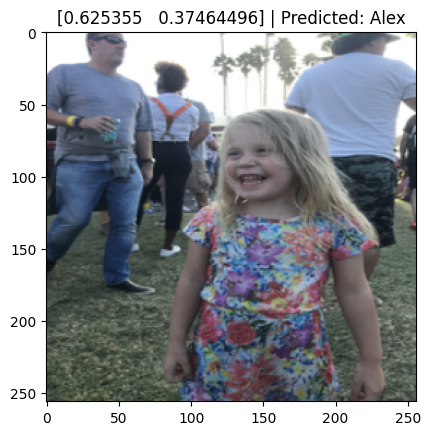

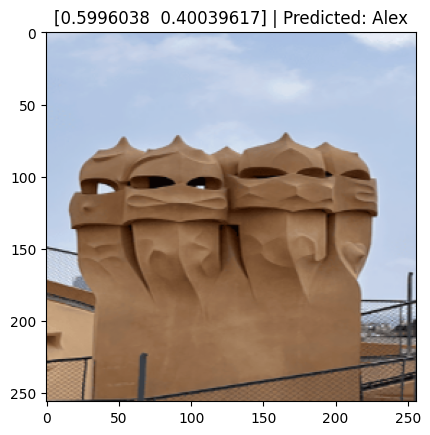

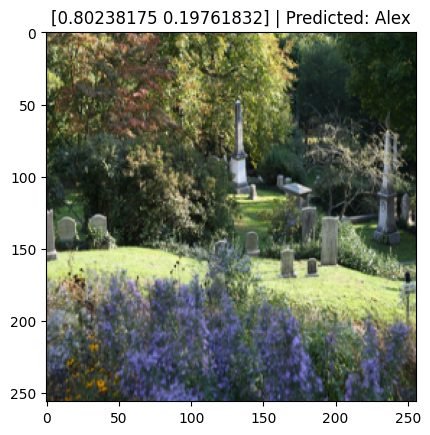

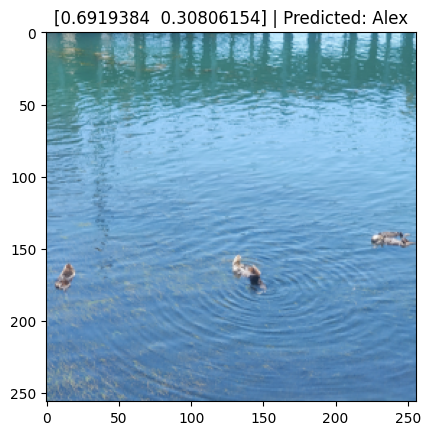

...

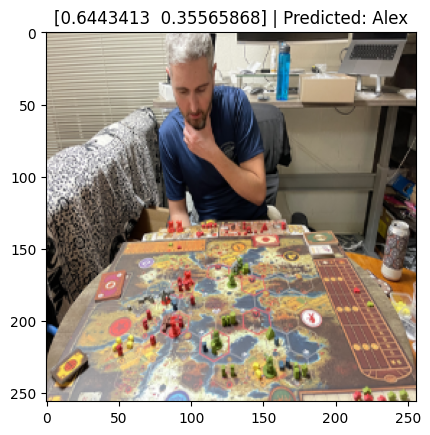

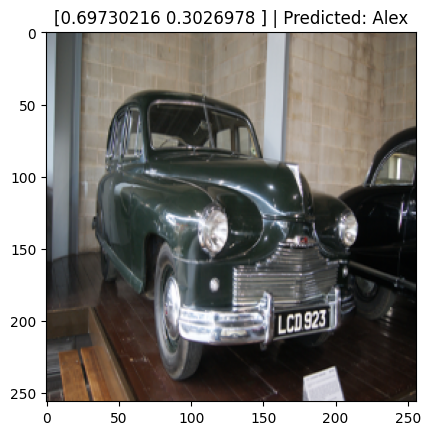

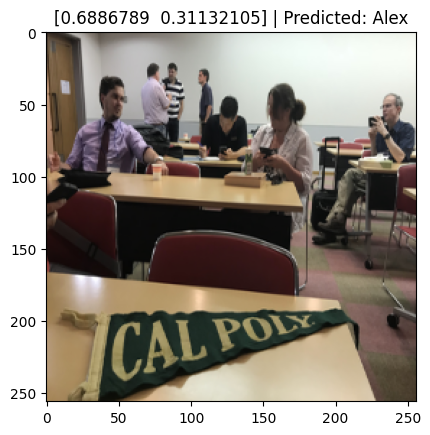

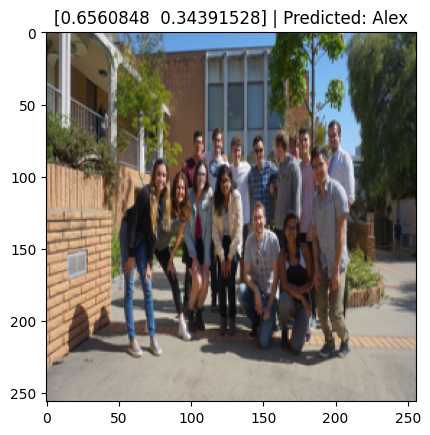

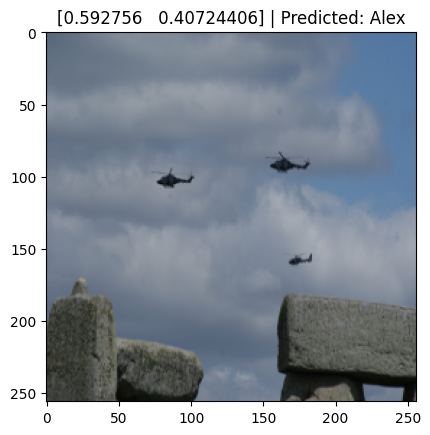

In [51]:
# predictions for test set 01
# preds1 = model.predict(test_images1)
preds1 = full_model.predict([test_images1, test_color_histograms1])

for img, pred in zip(test_images1, preds1):
    plt.imshow(img)
    plt.title(f"{pred} | Predicted: {class_labels[np.argmax(pred)]}")
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 927ms/step


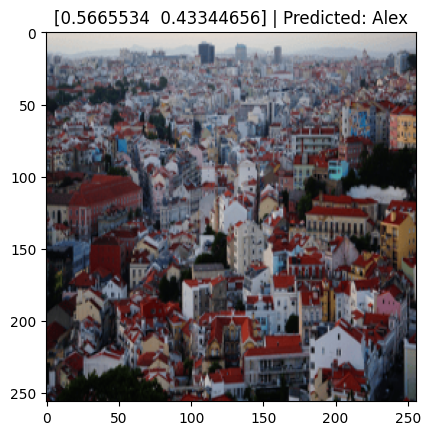

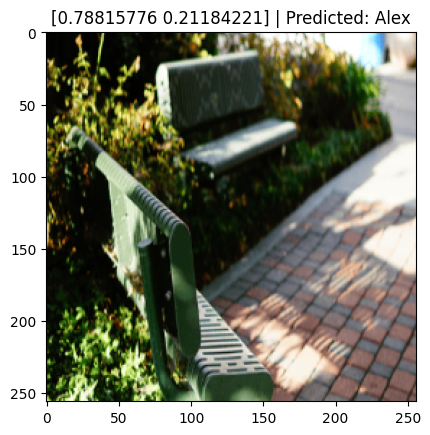

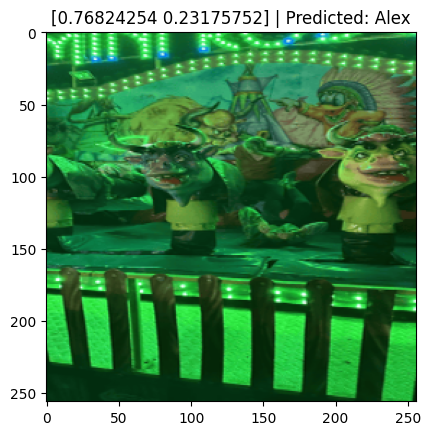

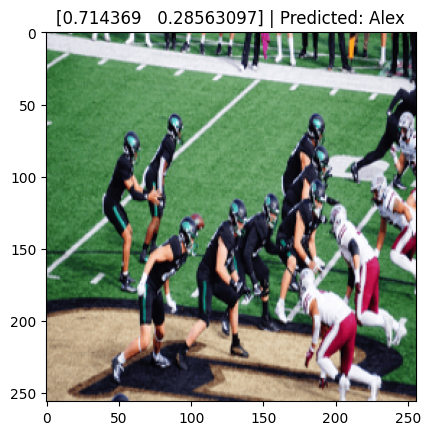

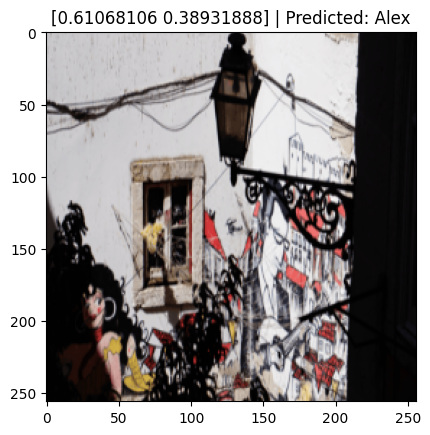

...

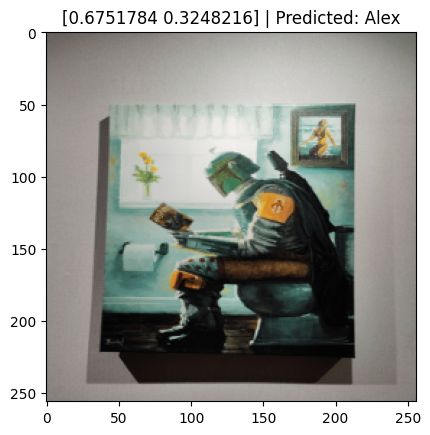

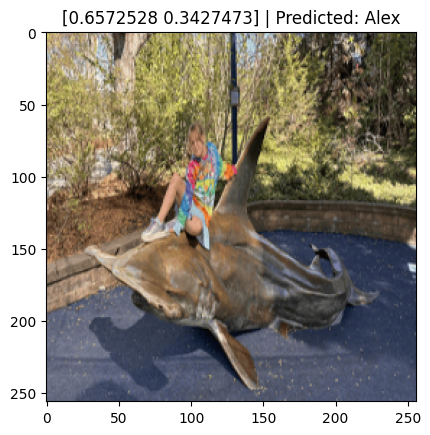

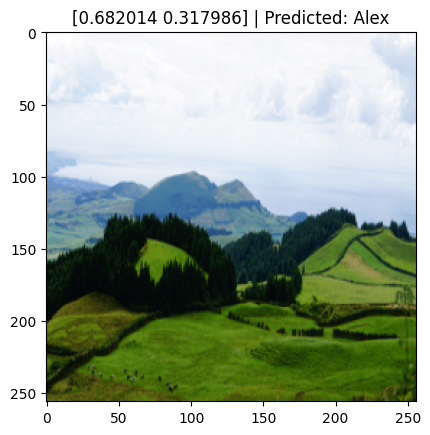

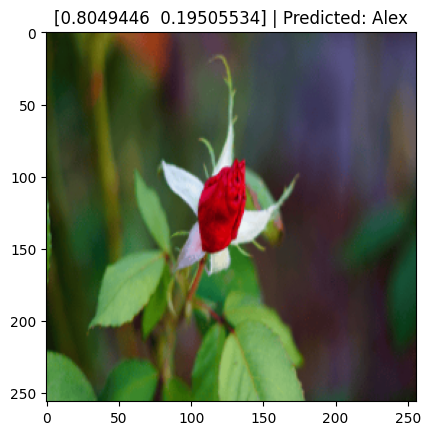

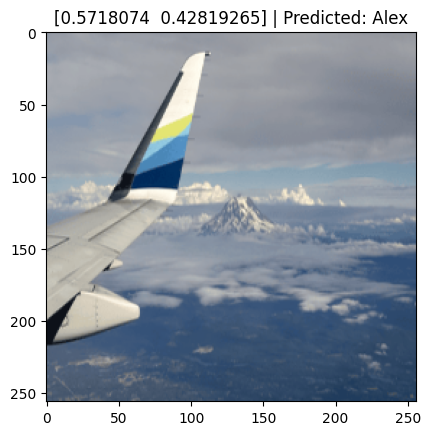

In [52]:
# predictions for test set 02
# preds2 = model.predict(test_images2)
preds2 = full_model.predict([test_images2, test_color_histograms2])

for img, pred in zip(test_images2, preds2):
    plt.imshow(img)
    plt.title(f"{pred} | Predicted: {class_labels[np.argmax(pred)]}")
    plt.show()